In [0]:
!pip3 install http://download.pytorch.org/whl/cu80/torch-0.3.0.post4-cp36-cp36m-linux_x86_64.whl 
!pip3 install torchvision

In [1]:
import numpy as np

import torch
from torch.autograd import Variable
from torch.optim import SGD
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image

import os
import copy
import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

def recreate_image(im_as_var):
    reverse_mean = [-0.485, -0.456, -0.406]
    reverse_std = [1/0.229, 1/0.224, 1/0.225]
    recreated_im = copy.copy(im_as_var.data.numpy()[0])
    for c in range(3):
        recreated_im[c] /= reverse_std[c]
        recreated_im[c] -= reverse_mean[c]
    recreated_im[recreated_im > 1] = 1
    recreated_im[recreated_im < 0] = 0
    recreated_im = np.round(recreated_im * 255)

    recreated_im = np.uint8(recreated_im).transpose(1, 2, 0)
    # Convert RBG to GBR
    recreated_im = recreated_im[..., ::-1]
    return recreated_im

def preprocess_image(cv2im, resize_im=True):
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    if resize_im:
        cv2im = Image.fromarray(cv2im).resize((224, 224))
    
    im_as_arr = np.float32(cv2im)
    im_as_arr = np.ascontiguousarray(im_as_arr[..., ::-1])
    im_as_arr = im_as_arr.transpose(2, 0, 1)  # Convert array to D,W,H
   
    for channel, _ in enumerate(im_as_arr):
        im_as_arr[channel] /= 255
        im_as_arr[channel] -= mean[channel]
        im_as_arr[channel] /= std[channel]
   
    im_as_ten = torch.from_numpy(im_as_arr).float()
    im_as_ten.unsqueeze_(0)
    im_as_var = Variable(im_as_ten, requires_grad=True)
    
    return im_as_var


loader = transforms.Compose([
    transforms.Resize((224, 224)), 
    transforms.ToTensor()
])

def image_loader(image_name):
    image = Image.open(image_name)
    plt.imshow(image)
    plt.pause(0.001)
    image = loader(image)
    image = Variable(image)
    image = image.unsqueeze(0)  
    return image


In [2]:
model = models.vgg16(pretrained=True)

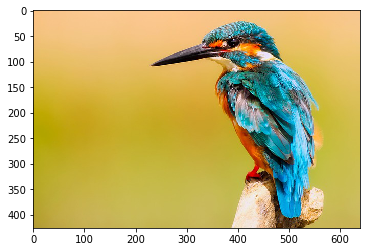

Variable containing:
 92
[torch.LongTensor of size 1]



In [3]:
image = image_loader('bird1.jpg')
model.eval()
output = model(image)
val, index = torch.max(output, 1)
print(index)

In [0]:
class CNNLayerVisualization():
    def __init__(self, model):
        self.model = model.cuda()
        self.model.eval()
        
        self.init_image()
  
    def init_image(self):
        self.created_image = np.uint8(np.full((224, 224, 3), 150))
        self.created_image = np.uint8(np.random.uniform(150, 180, (224, 224, 3)))
        
    def visualize_filter(self, layer_index, filter_index):
        self.init_image()
        self.processed_image = preprocess_image(self.created_image)
        optimizer = SGD([self.processed_image], lr=6, weight_decay=1e-6)
        
        for i in range(50):
            optimizer.zero_grad()
            x = self.processed_image
            
            for index, layer in enumerate(self.model.features):
                x = layer(x.cuda())
                if index == layer_index:
                    break
            
            output = x[0, filter_index]
            loss = torch.mean(output)
            loss.backward()
            optimizer.step()
            self.created_image = recreate_image(self.processed_image.cpu())
            
            """print('Iteration: ', str(i), ' Loss: {0:.2f}'.format(loss.data[0]))
            if i % 5 == 0:
                plt.axis('off')
                plt.imshow(self.created_image)
                plt.pause(0.001)"""
        return self.created_image
            
        
    def deep_dream(self, label):
        self.init_image()
        self.processed_image = preprocess_image(self.created_image)
        optimizer = SGD([self.processed_image], lr=6, weight_decay=1e-6)
        
        for i in range(50):
            optimizer.zero_grad()
            x = self.model(self.processed_image.cuda())
            loss = torch.mean(x[0, label])
            
            loss.backward()
            optimizer.step()
    
            self.created_image = recreate_image(self.processed_image.cpu())
      
            """print('Iteration:', str(i), 'Loss:', "{0:.2f}".format(loss.data[0]))
            if i % 5 == 0:
                plt.axis('off')
                plt.imshow(self.created_image)
                plt.pause(0.001)"""
        return self.created_image



In [0]:
def plot_images(im, titles=None):
  plt.figure(figsize=(25, 15))
 
  for i in range(len(im)):
    plt.subplot(10 / 5 + 1, 5, i + 1)
    plt.axis('off')
    if titles is not None:
      plt.title(titles[i])
    plt.imshow(im[i])
    
  # plt.subplots_adjust(wspace=2, hspace=0)

In [0]:
layer_vis = CNNLayerVisualization(model)

In [0]:
def show_layer(layer_num):
  images = []
  titles = []
  for i in range(10, 20):
    images.append(layer_vis.visualize_filter(layer_num, i))
    titles.append("Conv{}_{}".format(layer_num, i))

  plot_images(images, titles)

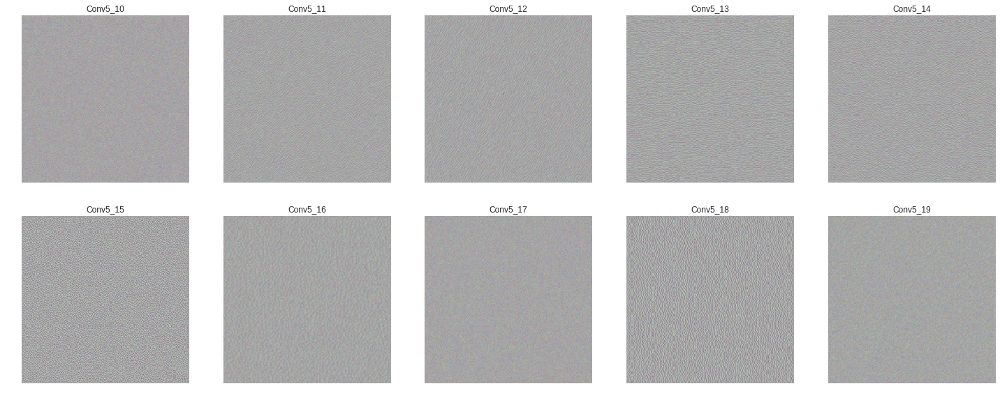

In [96]:
show_layer(5)

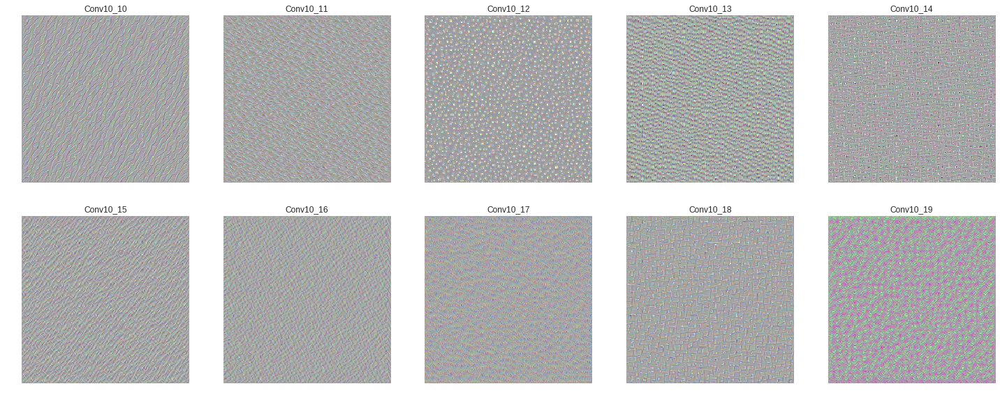

In [97]:
show_layer(10)

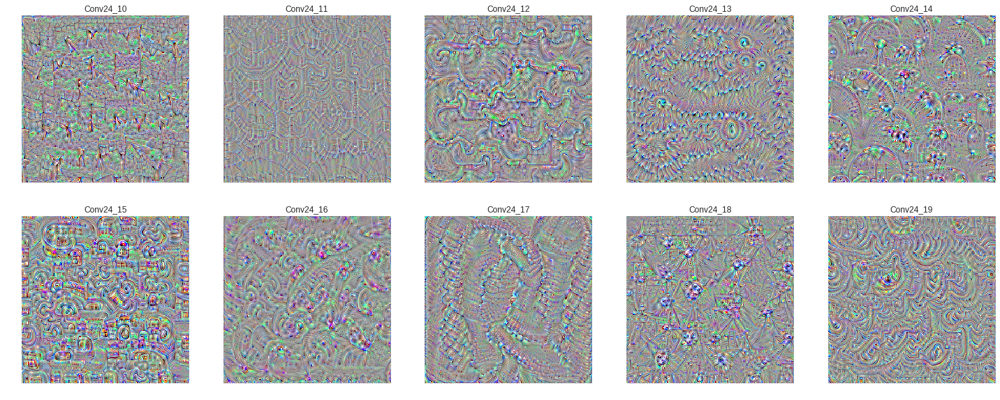

In [91]:
show_layer(24)

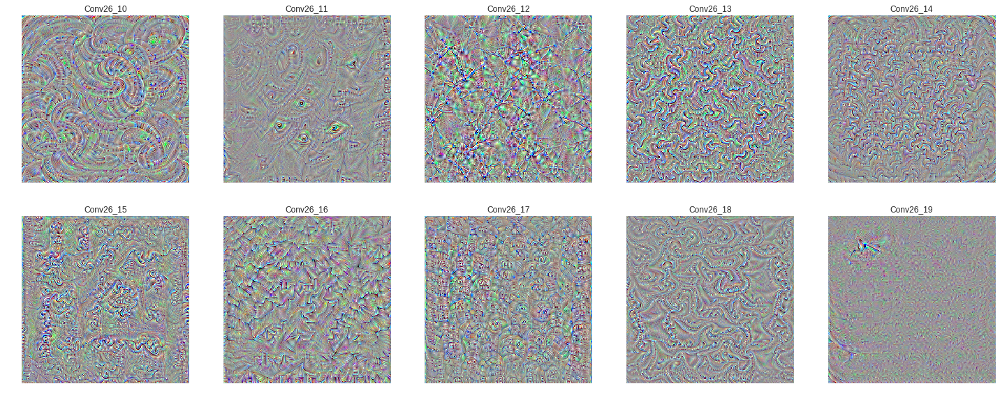

In [90]:
show_layer(26)

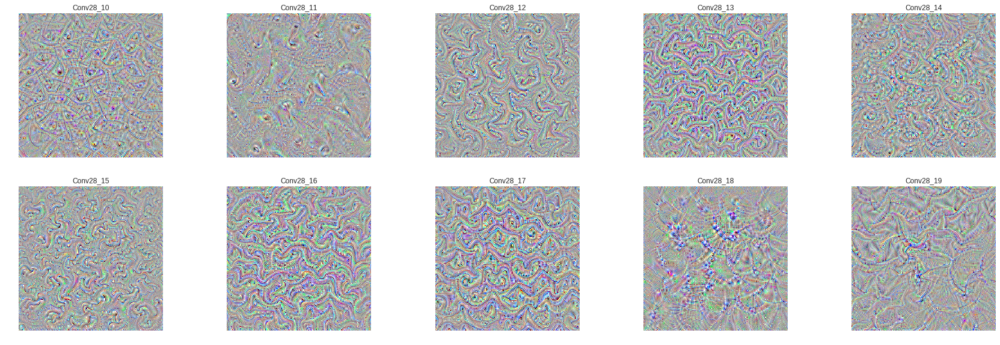

In [84]:
show_layer(28)

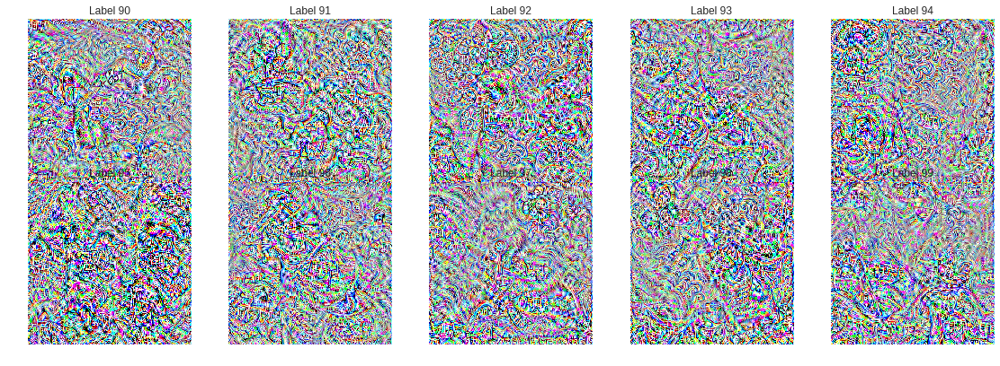

In [54]:
images = []
titles = []
for i in range(90, 100):
  images.append(layer_vis.deep_dream(i))
  titles.append("Label {}".format(i))

plot_images(images, titles)